### CHeck Data Loader

In [2]:
import torch
import os, sys

sys.path.append('../')

from model.attention_map import AttentionMapGray
from data_loader import ABDataset

from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import numpy as np

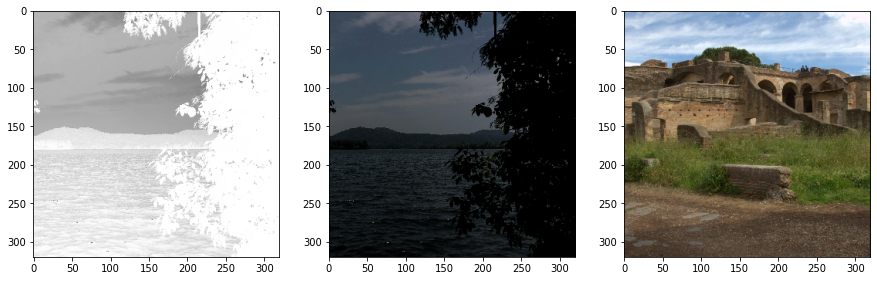

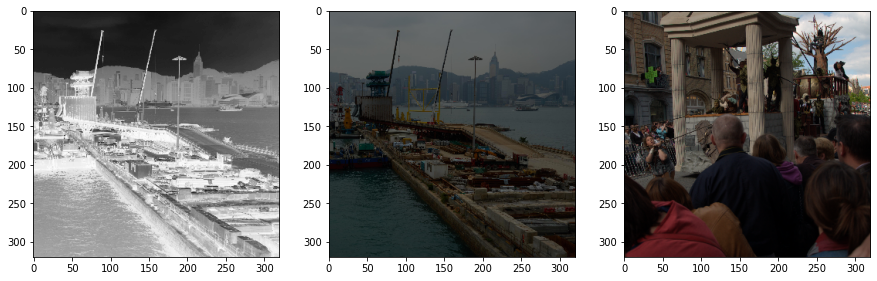

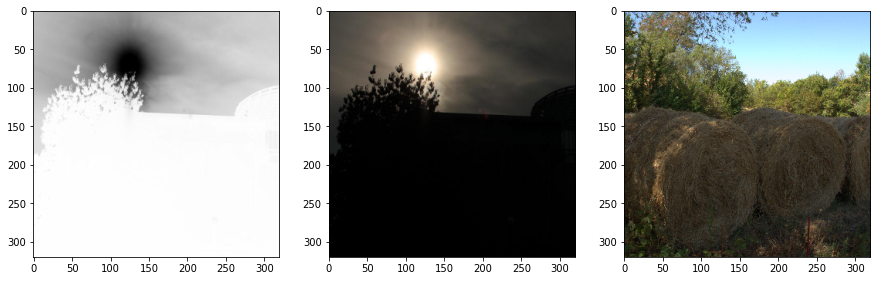

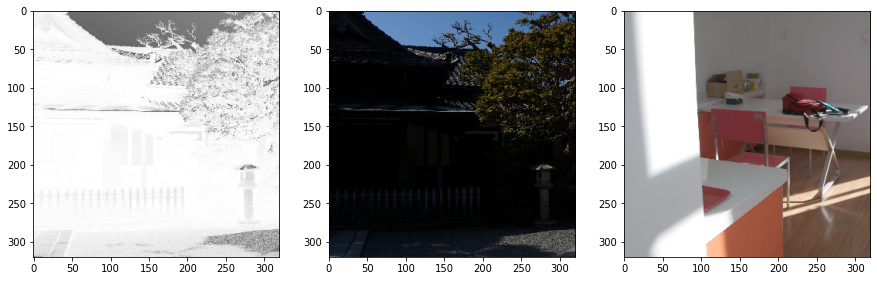

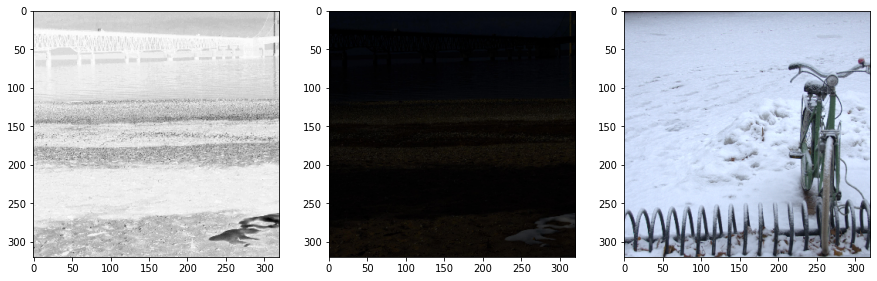

...

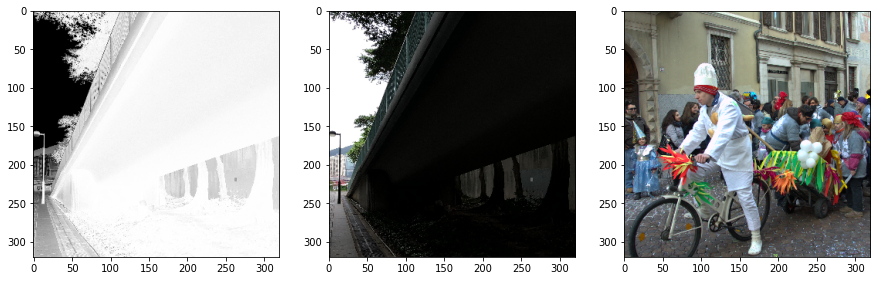

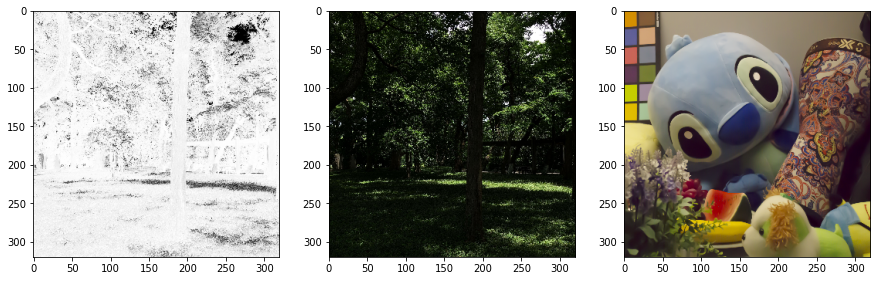

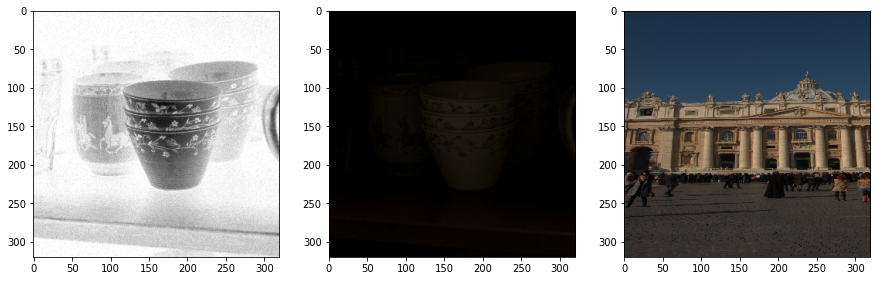

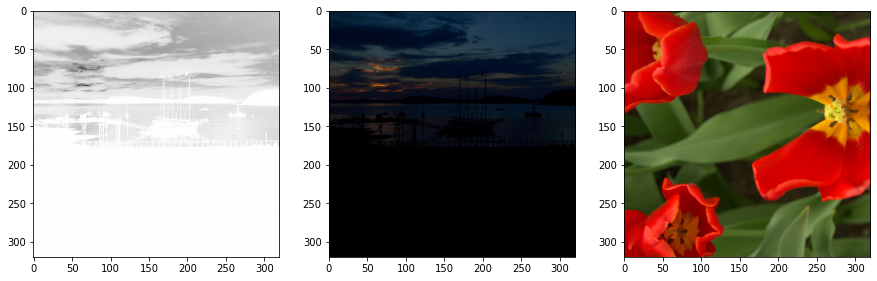

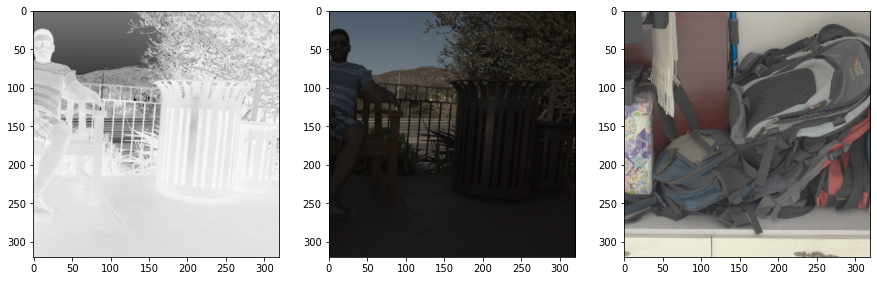

In [3]:
attention_map = AttentionMapGray()
dataset_root = '/home/student/Documents/alena/thesis/enlighte-gan-dataset'

dataset = ABDataset(dataset_root, attention_map, subroot_dark='dark_large', subroot_normal='normal_large')
dataset = DataLoader(dataset, batch_size=7, num_workers=1)

for i, data in enumerate(dataset):
    img_dark = data['dark']
    img_normal = data['normal']
    img_gray = data['gray']
    
    if i == 1:
        break
    fig, ax = plt.subplots(ncols=3, figsize=(15, 15))
    ax[0].imshow(img_gray[0, :, :, :].permute(1, 2, 0), cmap='gray')
    ax[1].imshow(((img_dark[0, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    ax[2].imshow(((img_normal[0, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    plt.show();
    

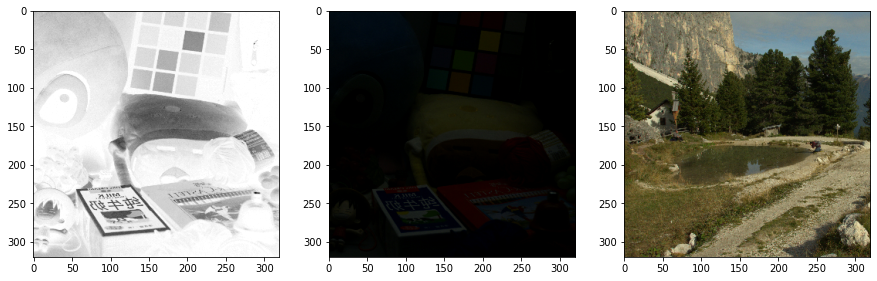

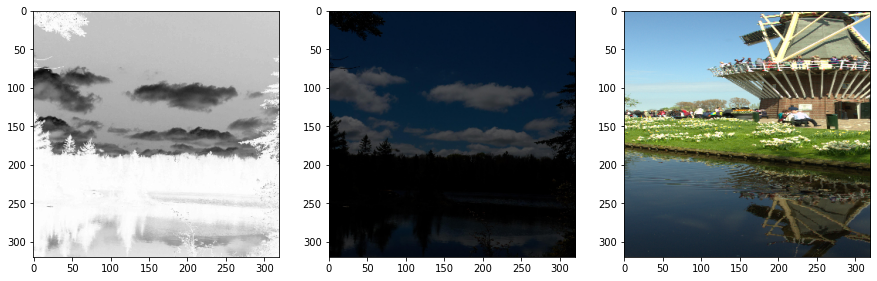

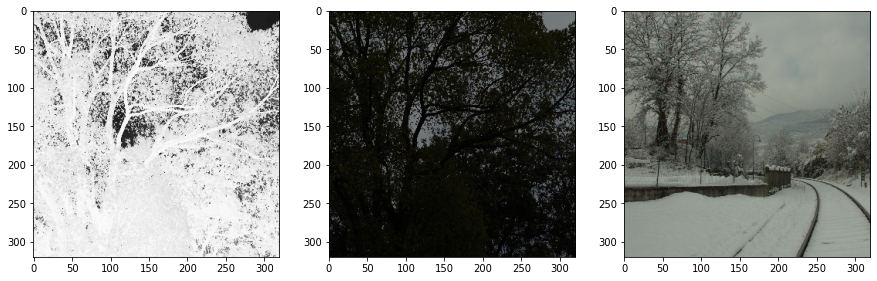

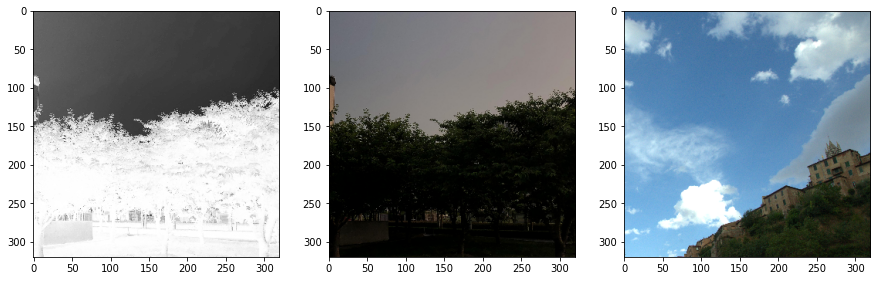

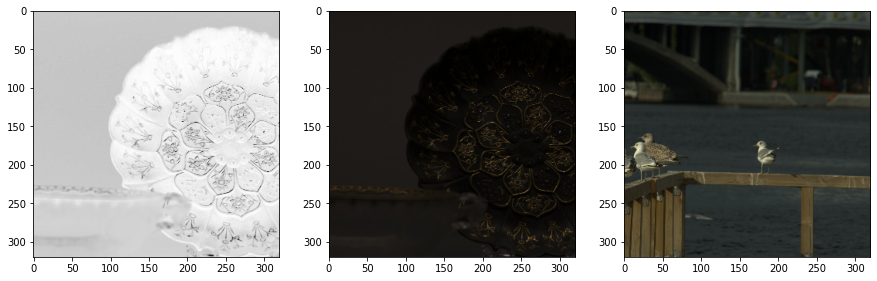

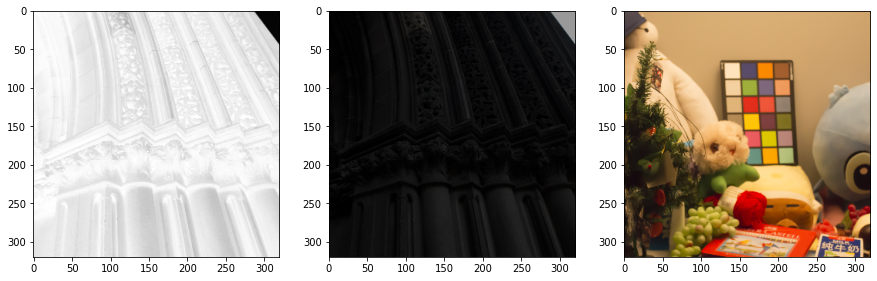

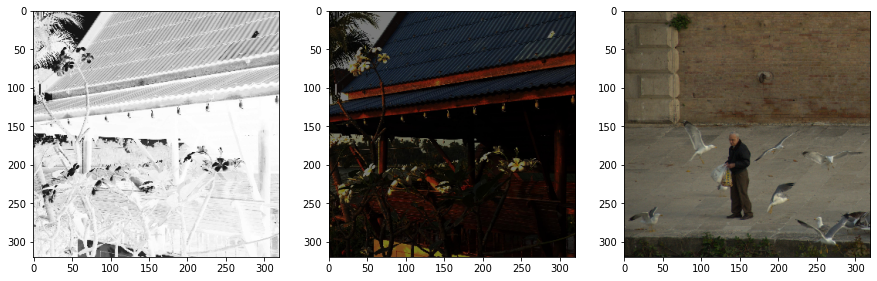

In [4]:
import matplotlib.pyplot as plt
import numpy as np

for n in range(7):
    fig, ax = plt.subplots(ncols=3, figsize=(15, 15))
    ax[0].imshow(img_gray[n, :, :, :].permute(1, 2, 0), cmap='gray')
    ax[1].imshow(((img_dark[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    ax[2].imshow(((img_normal[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    plt.show();

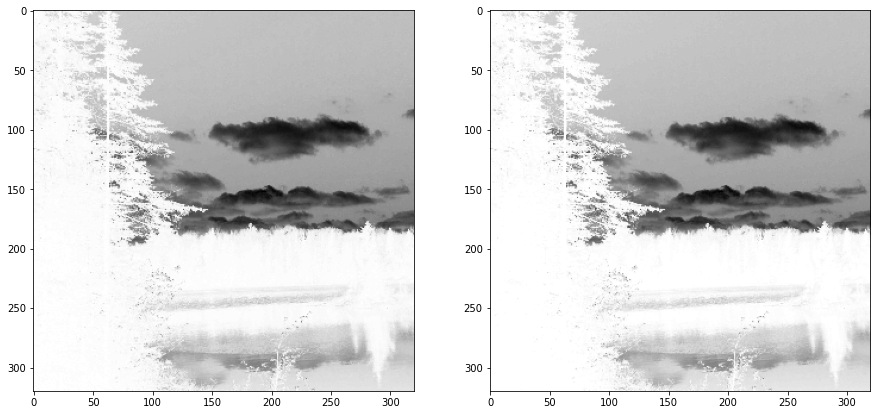

In [4]:
import cv2

n=1
image = ((img_dark[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8)
image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) / 255

fig, ax = plt.subplots(ncols=2, figsize=(15, 15))
ax[0].imshow(img_gray[n, :, :, :].permute(1, 2, 0), cmap='gray')
ax[1].imshow(1 - image_gray, cmap='gray')

In [47]:
img_gray[0, :, :, :].permute(1, 2, 0).numpy()[-3:, -3:]

array([[[0.9449726 ],
        [0.9449726 ],
        [0.9523686 ]],

       [[0.96890587],
        [0.9610627 ],
        [0.9610627 ]],

       [[0.976749  ],
        [0.9649843 ],
        [0.976749  ]]], dtype=float32)

In [48]:
(1 - image_gray.reshape(320, 320, 1))[-3:, -3:]

array([[[0.94901961],
        [0.94901961],
        [0.95686275]],

       [[0.97254902],
        [0.96470588],
        [0.96470588]],

       [[0.98039216],
        [0.96862745],
        [0.98039216]]])

In [5]:
import torch
import os, sys
torch.autograd.set_detect_anomaly(True)

sys.path.append('../')

from model.generators.enlighten_gan_generator import GeneratorEnlightenGAN
from model.discriminators.enlighten_gan_global_discriminator import GlobalDiscriminatorEnlightenGAN
from model.discriminators.enlighten_gan_local_discriminator import LocalDiscriminatorEnlightenGAN
from model.model import Model
from model.attention_map import AttentionMapGray
from model.loses.gan_loss import GanLoss
from model.vgg import Vgg16
from model.loses.vgg_loss import VGGLoss
from utils import patches
# from utils import weights
from data_loader import ABDataset

from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import time
import datetime

from utils import image_utils, image_tf
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda")
netG = GeneratorEnlightenGAN()
netG.to(device)

netD_global = GlobalDiscriminatorEnlightenGAN()
netD_global.to(device)

num_patches = 6
netD_local = LocalDiscriminatorEnlightenGAN()
netD_local.to(device)

attention_map = AttentionMapGray()
criterion = GanLoss()
vgg_loss = VGGLoss()

netVgg = Vgg16()
netVgg.to(device)
model_dir = '../saved_models'
netVgg.load_state_dict(torch.load(os.path.join(model_dir, 'vgg16.weight')))
netVgg.eval()

model = Model(netG, netD_global, netD_local, criterion, netVgg, vgg_loss)

niter = 100
niter_decay = 100
dataset_root = '/home/student/Documents/alena/thesis/enlighte-gan-dataset'

dataset = ABDataset(dataset_root, attention_map,subroot_dark='dark_large', subroot_normal='normal_large')
dataset = DataLoader(dataset, batch_size=7, num_workers=1)

In [6]:
img_generated = model.forward(img_dark, img_gray)

In [7]:
patches_dark_img, patches_normal_img, patches_generated_img = patches.create_patch(img_dark, img_normal, img_generated, num_patches=6)

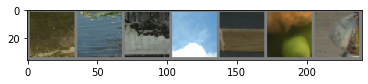

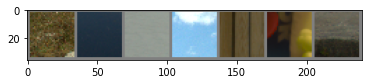

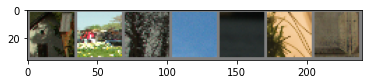

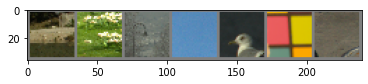

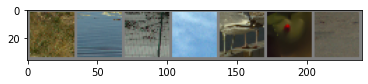

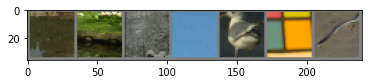

In [9]:
import torchvision
for i in range(6):
    fig, ax = plt.subplots()
    img_grid = torchvision.utils.make_grid(patches_normal_img[i])
    im = ((img_grid.permute(1, 2, 0) + 1 ) * 0.5).detach().cpu().numpy()
    plt.imshow(im)
    # writer.add_image('mean %f, max %f, min %f' %(patches_normal_img[0][0, :, :, :].mean(), patches_normal_img[0][0, :, :, :].max(), patches_normal_img[0][0, :, :, :].min(),), img_grid)

In [9]:
len(patches_dark_img)

6

<ipython-input-36-dcb5c2aea5ec>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=2, figsize=(10, 10))


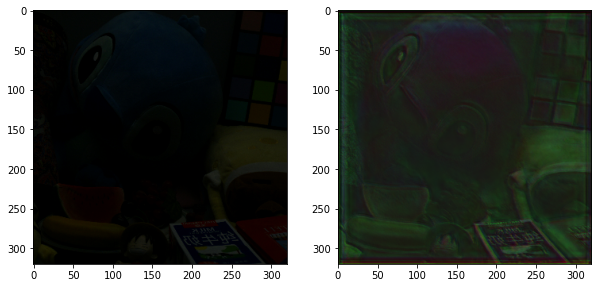

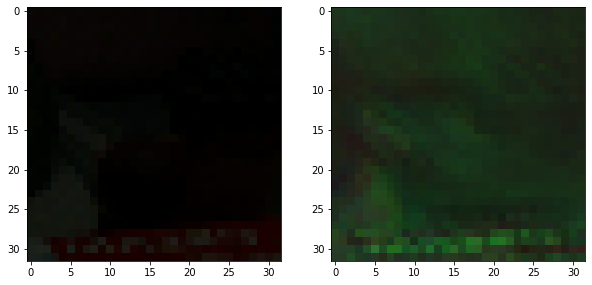

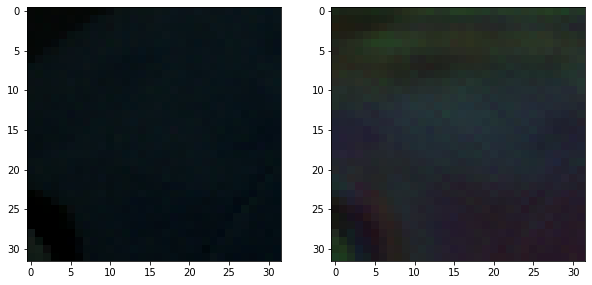

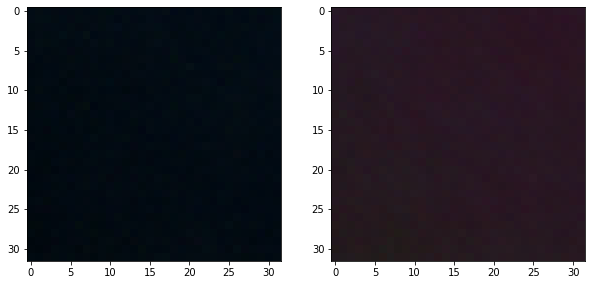

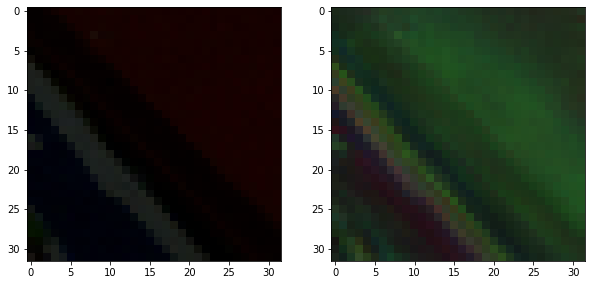

...

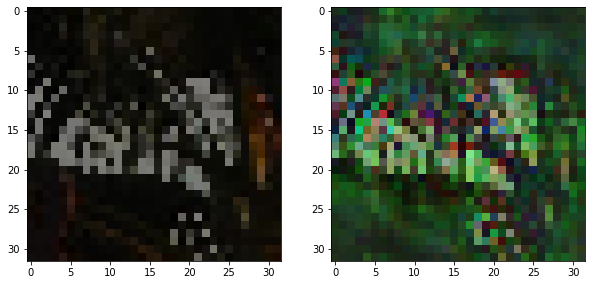

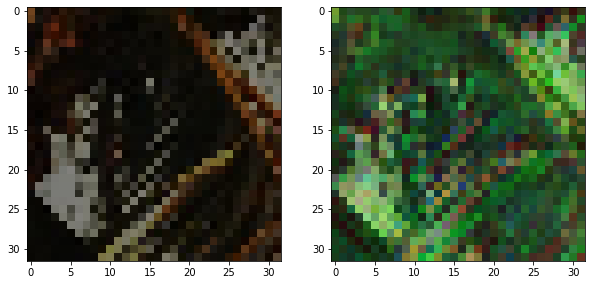

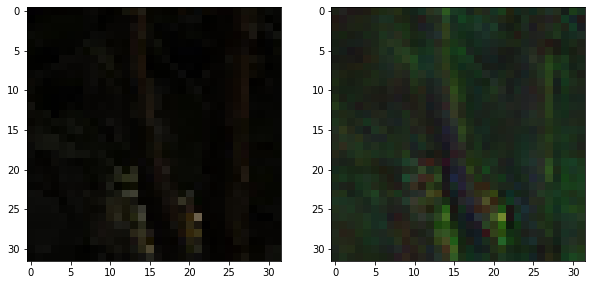

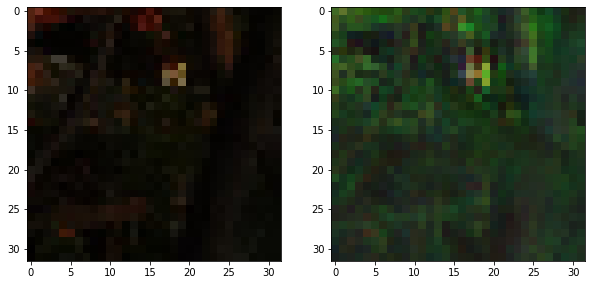

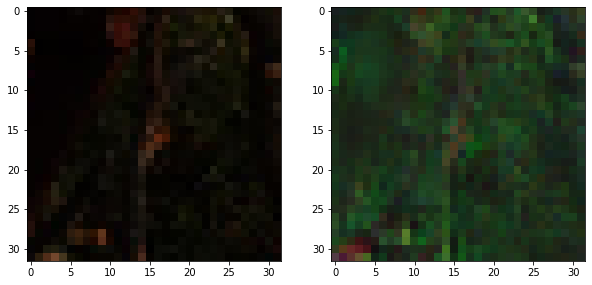

In [36]:
for n in range(7):
    fig, ax = plt.subplots(ncols=2, figsize=(10, 10))
    ax[0].imshow(((img_dark[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
    ax[1].imshow(((img_generated[n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).detach().cpu().numpy().astype(np.uint8))

    for i in range(6):
        fig, ax = plt.subplots(ncols=2, figsize=(10, 10))
        ax[0].imshow(((patches_dark_img[i][n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).numpy().astype(np.uint8))
        ax[1].imshow(((patches_generated_img[i][n, :, :, :].permute(1, 2, 0) + 1 )  * 255 * 0.5).detach().cpu().numpy().astype(np.uint8))

In [11]:
'mean %f, max %f, min %f' %(patches_dark_img[0].mean(), patches_dark_img[0].max(), patches_dark_img[0].min())

'mean -0.719135, max 0.082353, min -1.000000'

In [6]:
import torch
a = torch.Tensor([5])
a.requires_grad_(True)

tensor([5.], requires_grad=True)

In [7]:
b = torch.Tensor([10])
b.requires_grad_(False)

tensor([10.])

In [9]:
c = a*b
c.requires_grad

True

In [37]:
vgg_image = netVgg.forward(img_generated)

In [39]:
img_generated.shape

torch.Size([7, 3, 320, 320])

In [38]:
vgg_image.shape

torch.Size([7, 512, 40, 40])

### Check Local Discriminator

In [1]:
import torch
import os, sys

sys.path.append('../')

# from model.generators.enlighten_gan_generator import GeneratorEnlightenGAN
from model.discriminators.enlighten_gan_global_discriminator import GlobalDiscriminatorEnlightenGAN
from model.discriminators.enlighten_gan_local_discriminator import LocalDiscriminatorEnlightenGAN


In [2]:

netD_local = LocalDiscriminatorEnlightenGAN()

In [3]:
print(netD_local)

LocalDiscriminatorEnlightenGAN(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
  )
)


In [4]:
netD_global = GlobalDiscriminatorEnlightenGAN()

In [5]:
print(netD_global)

GlobalDiscriminatorEnlightenGAN(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
  )
)


### Generator check

In [1]:
import torch
import os, sys

sys.path.append('../')

from model.generators.enlighten_gan_generator import GeneratorEnlightenGAN

In [2]:
net_G = GeneratorEnlightenGAN()

In [3]:
print(net_G)

GeneratorEnlightenGAN(
  (conv_11): Sequential(
    (0): Conv2d(4, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (downsample_1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_12): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, af